# Hotel booking demand


![](https://nolimits-tours.com/wp-content/uploads/2017/06/hotel-ambasador-exterior-002.jpg)

This notebook is covering following topics.
* Problem statement
* Downloading the data
* Exploratory data analysis and visualisation
* Preprocessing and Feature Engineering
* Imputing and scaling numerical data
* Encoding categorical data
* Training and evaluating Logistic Regression Model
* Training and evaluating Decision Tree Model
* Training and evaluating  Random Forest Model
* Making Predictions on New Inputs
* Saving and Loading Trained Model

## Problem Statement

**Objective:** Predict the probability of booking cancellation.

>**Context**
>
>Have you ever wondered when the best time of year to book a hotel room is? Or the optimal length of stay in order to get the best daily rate? What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests?
>This hotel booking dataset can help you explore those questions!
>
>**Content**
>
>This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things.

Source of data: https://www.kaggle.com/jessemostipak/hotel-booking-demand

## Downloading the Data

In [5]:
import opendatasets as od
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import jovian
import os
%matplotlib inline

pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

<IPython.core.display.Javascript object>

In [6]:
od.download('https://www.kaggle.com/jessemostipak/hotel-booking-demand')

Skipping, found downloaded files in "./hotel-booking-demand" (use force=True to force download)


In [7]:
os.listdir('hotel-booking-demand/')

['hotel_bookings.csv']

In [8]:
bookings_df = pd.read_csv('hotel-booking-demand/hotel_bookings.csv')

In [9]:
bookings_df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [10]:
bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [11]:
print(f"Dataset contains {bookings_df.shape[0]} rows and {bookings_df.shape[1]} columns.")

Dataset contains 119390 rows and 32 columns.


In [12]:
bookings_df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


## Exploratory Data Analysis and Visualization

In [13]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [14]:
fig = px.histogram(bookings_df,
                   x='is_canceled')

fig.update_layout(bargap=0.1)
fig.show()

In [15]:
fig = px.histogram(bookings_df,
                   x='hotel',
                   color='is_canceled')

fig.update_layout(bargap=0.1)
fig.show()

In [16]:
fig = px.histogram(bookings_df.sample(1000),
                   x='lead_time',
                   color='is_canceled',
                   marginal='box',
                   title='Lead Time')

fig.update_layout(bargap=0.1)
fig.show()

# lead_time: Number of days that elapsed between the entering date of the booking into the PMS and the arrival date

In [17]:
px.histogram(bookings_df,
                 x='previous_cancellations',
                 y='previous_bookings_not_canceled',
                 color='is_canceled').update_layout(bargap=0.1)


In [18]:
fig = px.histogram(bookings_df,
             x='arrival_date_year',
             color='is_canceled',
             color_discrete_sequence=px.colors.qualitative.G10,
             labels={'arrival_date_year': 'Arrival date (year)', 'is_canceled': 'Is canceled?'},
             title='Year of arrival')

fig.update_layout(bargap=0.1)
fig.update_xaxes(type='category')
fig.show()


In [19]:
fig = px.histogram(bookings_df,
             x='arrival_date_month',
             color='is_canceled',
             color_discrete_sequence=px.colors.qualitative.G10,
             labels={'arrival_date_month': 'Arrival month', 'is_canceled': 'Is canceled?'},
             title='Month of arrival')

fig.update_layout(bargap=0.1)
fig.update_xaxes(type='category')
fig.show()


In [20]:
fig = px.histogram(bookings_df, 
             x='is_repeated_guest',
             color='is_canceled',
             facet_col='hotel')
fig.update_layout(bargap=0.1)
fig.update_xaxes(type='category')
fig.show()

In [21]:
top_countries = list(bookings_df.country.value_counts().head(10).index)
top_countries

['PRT', 'GBR', 'FRA', 'ESP', 'DEU', 'ITA', 'IRL', 'BEL', 'BRA', 'NLD']

In [22]:
fig = px.histogram(bookings_df[bookings_df.country.isin(top_countries)],
             x='country',
             color='is_canceled',
             facet_col='hotel')
fig.update_layout(bargap=0.1)
fig.update_layout(title='Bookings by countries (Top 10)')
# fig.update_xaxes(categoryorder='total descending')
fig.show()

In [23]:
bookings_df.corr()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
is_canceled,1.000000,0.293123,0.016660,0.008148,-0.006130,-0.001791,0.024765,0.060017,0.005048,-0.032491,-0.084793,0.110133,-0.057358,-0.144381,-0.083114,-0.020642,0.054186,0.047557,-0.195498,-0.234658
lead_time,0.293123,1.000000,0.040142,0.126871,0.002268,0.085671,0.165799,0.119519,-0.037622,-0.020915,-0.124410,0.086042,-0.073548,0.000149,-0.069741,0.151464,0.170084,-0.063077,-0.116451,-0.095712
arrival_date_year,0.016660,0.040142,1.000000,-0.540561,-0.000221,0.021497,0.030883,0.029635,0.054624,-0.013192,0.010341,-0.119822,0.029218,0.030872,0.063457,0.259095,-0.056497,0.197580,-0.013684,0.108531
arrival_date_week_number,0.008148,0.126871,-0.540561,1.000000,0.066809,0.018208,0.015558,0.025909,0.005518,0.010395,-0.030131,0.035501,-0.020904,0.005508,-0.031201,-0.076760,0.022933,0.075791,0.001920,0.026149
arrival_date_day_of_month,-0.006130,0.002268,-0.000221,0.066809,1.000000,-0.016354,-0.028174,-0.001566,0.014544,-0.000230,-0.006145,-0.027011,-0.000300,0.010613,0.001487,0.044858,0.022728,0.030245,0.008683,0.003062
stays_in_weekend_nights,-0.001791,0.085671,0.021497,0.018208,-0.016354,1.000000,0.498969,0.091871,0.045793,0.018483,-0.087239,-0.012775,-0.042715,0.063281,0.140739,0.066749,-0.054151,0.049342,-0.018554,0.072671
stays_in_week_nights,0.024765,0.165799,0.030883,0.015558,-0.028174,0.498969,1.000000,0.092976,0.044203,0.020191,-0.097245,-0.013992,-0.048743,0.096209,0.182382,0.182211,-0.002020,0.065237,-0.024859,0.068192
adults,0.060017,0.119519,0.029635,0.025909,-0.001566,0.091871,0.092976,1.000000,0.030447,0.018146,-0.146426,-0.006738,-0.107983,-0.051673,-0.035594,0.207793,-0.008283,0.230641,0.014785,0.122884
children,0.005048,-0.037622,0.054624,0.005518,0.014544,0.045793,0.044203,0.030447,1.000000,0.024030,-0.032859,-0.024730,-0.021072,0.048949,0.041066,0.030931,-0.033273,0.324854,0.056253,0.081745
babies,-0.032491,-0.020915,-0.013192,0.010395,-0.000230,0.018483,0.020191,0.018146,0.024030,1.000000,-0.008943,-0.007501,-0.006550,0.083440,0.036184,0.019206,-0.010621,0.029186,0.037383,0.097889


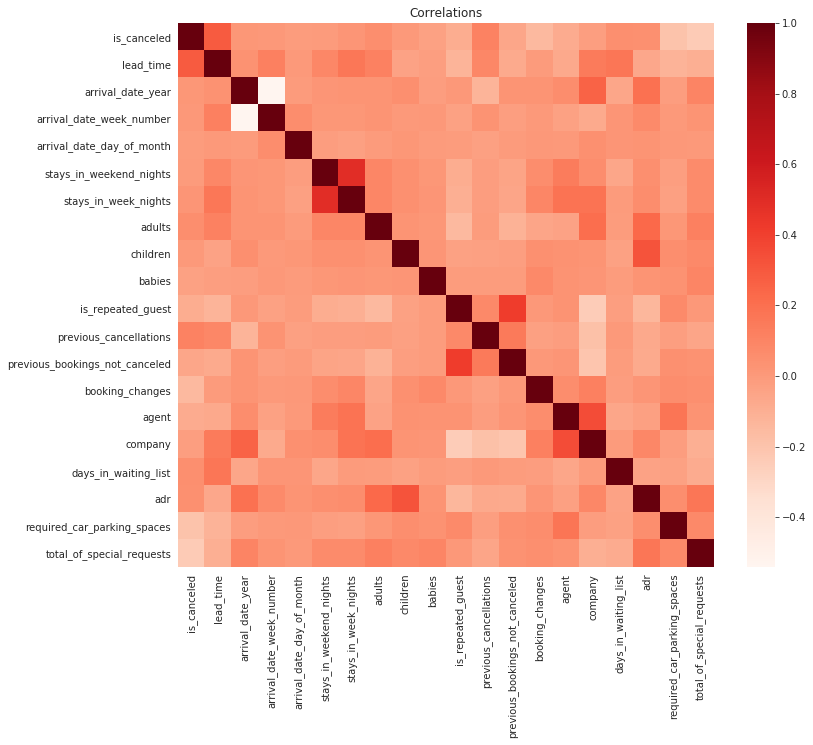

In [24]:
plt.figure(figsize=(12, 10))
plt.title('Correlations')
sns.heatmap(bookings_df.corr(), cmap='Reds');

In [25]:
import jovian
# jovian.commit(project='hotel-booking-demand', filename='hotel-booking-demand.ipynb')

## Preprocessing and Feature Engineering

In [26]:
bookings_df.sample(10)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
17239,Resort Hotel,0,0,2015,October,40,1,0,1,2,0.0,0,BB,FRA,Direct,Direct,0,0,0,F,F,0,No Deposit,NaN,NaN,0,Transient,120.00,1,0,Check-Out,2015-10-02
42050,City Hotel,1,104,2015,August,36,30,2,1,2,0.0,0,HB,ESP,Groups,TA/TO,0,0,0,A,A,0,Non Refund,1.0,NaN,0,Transient,90.00,0,0,Canceled,2015-07-22
42459,City Hotel,0,22,2015,September,37,6,1,0,2,0.0,0,BB,ITA,Online TA,TA/TO,0,0,0,A,F,0,No Deposit,9.0,NaN,0,Transient,105.00,0,0,Check-Out,2015-09-07
41212,City Hotel,0,39,2015,August,33,14,0,2,2,0.0,0,HB,DEU,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,6.0,NaN,0,Transient-Party,109.00,0,0,Check-Out,2015-08-16
23913,Resort Hotel,0,108,2016,April,18,30,2,5,2,0.0,0,BB,SWE,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,253.0,NaN,0,Transient,50.93,0,0,Check-Out,2016-05-07
4354,Resort Hotel,1,3,2016,March,11,7,1,1,1,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,D,0,No Deposit,339.0,NaN,0,Transient,25.00,0,0,Canceled,2016-03-07
75888,City Hotel,1,274,2015,July,29,18,2,2,2,0.0,0,BB,PRT,Groups,TA/TO,0,1,0,A,A,0,No Deposit,1.0,NaN,0,Transient-Party,62.00,0,0,Canceled,2015-07-06
23014,Resort Hotel,0,1,2016,April,16,12,0,1,2,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,330.0,NaN,0,Transient,67.50,0,0,Check-Out,2016-04-13
69204,City Hotel,1,246,2017,May,21,27,1,1,2,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,12.0,NaN,0,Transient-Party,100.00,0,0,Canceled,2017-01-25
3219,Resort Hotel,0,78,2015,November,47,21,0,1,2,0.0,0,BB,PRT,Corporate,Corporate,0,0,0,A,D,0,No Deposit,NaN,342.0,0,Transient-Party,32.00,0,0,Check-Out,2015-11-22


In [27]:
bookings_df.is_canceled = bookings_df.is_canceled.astype('object')
bookings_df.is_repeated_guest = bookings_df.is_repeated_guest.astype('object')
bookings_df.agent = bookings_df.agent.astype('object')
bookings_df.company = bookings_df.company.astype('object')
bookings_df.adr = bookings_df.adr.astype('object')

In [28]:
bookings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  object 
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

**Create new features**

In [29]:
bookings_df['total_children'] = bookings_df.children + bookings_df.babies

In [30]:
bookings_df['total_people'] = bookings_df.total_children + bookings_df.adults

In [31]:
bookings_df.sample(10)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_children,total_people
12102,Resort Hotel,1,130,2017,June,24,13,2,5,2,0.0,0,BB,IRL,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,240.0,NaN,0,Transient,140.0,0,1,Canceled,2017-02-09,0.0,2.0
12171,Resort Hotel,1,60,2017,June,24,16,2,5,2,1.0,0,HB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,167.0,0,1,Canceled,2017-04-17,1.0,3.0
105376,City Hotel,0,15,2017,February,5,3,1,2,2,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,8.0,NaN,0,Transient,86.4,0,0,Check-Out,2017-02-06,0.0,2.0
20891,Resort Hotel,0,1,2016,February,7,12,0,1,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,E,0,No Deposit,240.0,NaN,0,Transient,105.0,0,1,Check-Out,2016-02-13,0.0,2.0
89345,City Hotel,0,104,2016,May,21,17,0,3,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,140.4,0,1,Check-Out,2016-05-20,0.0,2.0
81894,City Hotel,1,178,2016,April,18,28,0,3,2,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,1,0,A,A,0,Non Refund,19.0,NaN,46,Transient,120.0,0,0,Canceled,2015-12-18,0.0,2.0
92651,City Hotel,0,60,2016,July,28,9,0,1,3,0.0,0,BB,COL,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,152.1,0,2,Check-Out,2016-07-10,0.0,3.0
76917,City Hotel,1,342,2015,September,39,24,2,4,2,0.0,0,BB,PRT,Groups,TA/TO,0,1,0,A,A,0,Non Refund,1.0,NaN,0,Transient,170.0,0,0,Canceled,2015-08-21,0.0,2.0
60457,City Hotel,1,300,2016,November,46,11,0,2,2,0.0,0,BB,PRT,Groups,TA/TO,0,0,0,A,A,0,Non Refund,1.0,NaN,0,Transient,65.0,0,0,Canceled,2016-03-14,0.0,2.0
30915,Resort Hotel,0,26,2016,December,50,4,2,2,2,0.0,0,BB,FRA,Offline TA/TO,TA/TO,0,0,0,E,E,0,No Deposit,8.0,NaN,0,Transient,50.0,0,0,Check-Out,2016-12-08,0.0,2.0


## Training, Validation and Test Sets

<img src="https://i.imgur.com/j8eITrK.png" width="480">

In [32]:
# !pip install scikit-learn --upgrade --quiet

from sklearn.model_selection import train_test_split

In [33]:
# Generic name to original df for simplicity
raw_df = bookings_df

In [34]:
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=123)

In [35]:
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=123)

In [36]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (71634, 34)
val_df.shape : (23878, 34)
test_df.shape : (23878, 34)


However, while working with dates, it's often a better idea to separate the training, validation and test sets with time, so that the model is trained on data from the past and evaluated on data from the future.

In [37]:
train_df = raw_df[raw_df.arrival_date_year < 2017]
val_df = raw_df[(raw_df.arrival_date_year == 2017) & (raw_df.arrival_date_week_number <= 19)]
test_df = raw_df[(raw_df.arrival_date_year == 2017) & (raw_df.arrival_date_week_number > 19)]

In [38]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (78703, 34)
val_df.shape : (21097, 34)
test_df.shape : (19590, 34)


In [39]:
train_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_children,total_people
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,0.0,2.0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,0.0,2.0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,0.0,1.0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02,0.0,1.0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03,0.0,2.0


In [40]:
val_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_children,total_people
9775,Resort Hotel,1,74,2017,January,1,1,1,0,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,5.0,NaN,0,Transient,57.6,0,0,Canceled,2016-10-20,0.0,2.0
9776,Resort Hotel,1,62,2017,January,1,1,2,2,2,0.0,0,BB,AUT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,51.5,0,1,Canceled,2016-12-04,0.0,2.0
9777,Resort Hotel,1,62,2017,January,1,1,2,2,2,0.0,0,BB,AUT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,51.5,0,1,Canceled,2016-11-11,0.0,2.0
9778,Resort Hotel,1,62,2017,January,1,1,2,2,2,0.0,0,BB,AUT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,51.5,0,1,Canceled,2016-12-04,0.0,2.0
9779,Resort Hotel,1,71,2017,January,1,1,2,2,1,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,241.0,NaN,0,Transient,32.22,0,1,Canceled,2016-10-29,0.0,1.0


In [41]:
test_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_children,total_people
11528,Resort Hotel,1,47,2017,May,20,14,1,0,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,89.0,0,0,Canceled,2017-04-22,0.0,2.0
11529,Resort Hotel,1,101,2017,May,20,14,1,0,2,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,251.0,NaN,0,Transient-Party,62.0,0,0,Canceled,2017-04-18,0.0,2.0
11530,Resort Hotel,1,101,2017,May,20,14,1,0,1,0.0,0,BB,PRT,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,251.0,NaN,0,Transient-Party,44.0,0,0,Canceled,2017-04-18,0.0,1.0
11531,Resort Hotel,1,3,2017,May,20,14,1,0,2,0.0,0,BB,PRT,Corporate,Corporate,0,0,0,A,A,0,No Deposit,NaN,445.0,0,Transient,95.0,0,0,Canceled,2017-05-14,0.0,2.0
11532,Resort Hotel,1,98,2017,May,20,14,2,1,1,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,76.0,0,2,Canceled,2017-02-25,0.0,1.0


## Identifying Input and Target Columns

In [42]:
train_df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'total_children',
       'total_people'],
      dtype='object')

In [43]:
# Not using columns to predict 'is_canceled': 'reservation_status', 'reservation_status_date', 'adr',  'agent', 'company'.
input_cols = ['hotel', 'lead_time', 'arrival_date_year',
            'arrival_date_month', 'arrival_date_week_number',
            'arrival_date_day_of_month', 'stays_in_weekend_nights',
            'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
            'country', 'market_segment', 'distribution_channel',
            'is_repeated_guest', 'previous_cancellations',
            'previous_bookings_not_canceled', 'reserved_room_type',
            'assigned_room_type', 'booking_changes', 'deposit_type',
            'days_in_waiting_list', 'customer_type',
            'required_car_parking_spaces', 'total_of_special_requests',
            'total_children', 'total_people']

target_col = 'is_canceled'

In [44]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [45]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [46]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [47]:
train_inputs

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_children,total_people
0,Resort Hotel,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0,Transient,0,0,0.0,2.0
1,Resort Hotel,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0,Transient,0,0,0.0,2.0
2,Resort Hotel,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0,Transient,0,0,0.0,1.0
3,Resort Hotel,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,0,Transient,0,0,0.0,1.0
4,Resort Hotel,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,0,1,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104142,City Hotel,17,2016,December,53,30,2,5,2,0.0,0,SC,FRA,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,0,Transient,0,1,0.0,2.0
104145,City Hotel,177,2016,December,53,30,2,5,0,0.0,0,BB,PRT,Direct,Direct,0,0,0,E,K,2,No Deposit,0,Transient,0,2,0.0,0.0
104147,City Hotel,107,2016,December,53,31,2,5,2,0.0,0,BB,FRA,Offline TA/TO,TA/TO,0,0,0,A,B,0,No Deposit,0,Transient,0,0,0.0,2.0
104216,City Hotel,310,2016,December,53,27,2,10,2,0.0,0,SC,DEU,Online TA,TA/TO,0,0,0,A,A,2,No Deposit,0,Transient-Party,0,2,0.0,2.0


In [48]:
train_targets

0         0
1         0
2         0
3         0
4         0
         ..
104142    0
104145    0
104147    0
104216    0
104219    0
Name: is_canceled, Length: 78703, dtype: object

## Numerical and categorical columns

Let's also identify which of the columns are numerical and which ones are categorical. This will be useful later, as we'll need to convert the categorical data to numbers for training a logistic regression model.

In [49]:
import numpy as np

In [50]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [51]:
train_inputs[numeric_cols].describe()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,total_children,total_people
count,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78699.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78699.000000,78699.000000
mean,101.298464,2015.720519,31.577399,15.839943,0.903968,2.447963,1.845241,0.092314,0.008716,0.126018,0.119538,0.211656,3.399527,0.066414,0.517007,0.101031,1.946251
std,106.200649,0.448747,13.332981,8.776052,0.989566,1.871663,0.617556,0.377153,0.104656,1.029279,1.337751,0.635416,21.352429,0.249923,0.757846,0.393886,0.741986
min,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16.000000,2015.000000,21.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,65.000000,2016.000000,34.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,158.000000,2016.000000,42.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000
max,737.000000,2016.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,26.000000,58.000000,21.000000,391.000000,3.000000,5.000000,10.000000,55.000000


In [52]:
train_inputs[categorical_cols].nunique()

hotel                     2
arrival_date_month       12
meal                      5
country                 159
market_segment            8
distribution_channel      5
is_repeated_guest         2
reserved_room_type       10
assigned_room_type       12
deposit_type              3
customer_type             4
dtype: int64

## Imputing Missing Numeric Data


In [53]:
from sklearn.impute import SimpleImputer

In [54]:
imputer = SimpleImputer(strategy='mean')

In [55]:
raw_df[numeric_cols].isna().sum()

lead_time                         0
arrival_date_year                 0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          4
babies                            0
previous_cancellations            0
previous_bookings_not_canceled    0
booking_changes                   0
days_in_waiting_list              0
required_car_parking_spaces       0
total_of_special_requests         0
total_children                    4
total_people                      4
dtype: int64

In [56]:
imputer.fit(bookings_df[numeric_cols])

SimpleImputer()

In [57]:
list(imputer.statistics_)

[104.01141636652986,
 2016.156554150264,
 27.16517296255968,
 15.798241058715135,
 0.9275986263506156,
 2.500301532791691,
 1.8564033838679956,
 0.10388990333874994,
 0.007948739425412514,
 0.08711784906608594,
 0.13709690928888515,
 0.22112404724013737,
 2.321149174972778,
 0.06251779881062065,
 0.5713627607002262,
 0.11183890908481732,
 1.9682291055902703]

In [58]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [59]:
train_inputs[numeric_cols].isna().sum()

lead_time                         0
arrival_date_year                 0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
previous_cancellations            0
previous_bookings_not_canceled    0
booking_changes                   0
days_in_waiting_list              0
required_car_parking_spaces       0
total_of_special_requests         0
total_children                    0
total_people                      0
dtype: int64

## Scaling Numeric Features


In [60]:
from sklearn.preprocessing import MinMaxScaler

In [61]:
scaler = MinMaxScaler()
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

In [62]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [63]:
train_inputs[numeric_cols].describe()

,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,total_children,total_people
count,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000,78703.000000
mean,0.137447,0.360259,0.588027,0.494665,0.047577,0.048959,0.033550,0.009231,0.000872,0.004847,0.001660,0.010079,0.008694,0.008302,0.103401,0.010103,0.035386
std,0.144099,0.224374,0.256403,0.292535,0.052082,0.037433,0.011228,0.037714,0.010466,0.039588,0.018580,0.030258,0.054610,0.031240,0.151569,0.039388,0.013490
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.021710,0.000000,0.384615,0.233333,0.000000,0.020000,0.036364,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.036364
50%,0.088195,0.500000,0.634615,0.500000,0.052632,0.040000,0.036364,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.036364
75%,0.214383,0.500000,0.788462,0.733333,0.105263,0.060000,0.036364,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.036364
max,1.000000,0.500000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.805556,1.000000,1.000000,0.375000,1.000000,1.000000,1.000000


## Encoding Categorical Data


In [64]:
from sklearn.preprocessing import OneHotEncoder

In [65]:
raw_df[categorical_cols].nunique()

hotel                     2
arrival_date_month       12
meal                      5
country                 177
market_segment            8
distribution_channel      5
is_repeated_guest         2
reserved_room_type       10
assigned_room_type       12
deposit_type              3
customer_type             4
dtype: int64

In [66]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [67]:
encoder.fit(raw_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [68]:
# encoder.categories_

In [69]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))
print(encoded_cols)

['hotel_City Hotel', 'hotel_Resort Hotel', 'arrival_date_month_April', 'arrival_date_month_August', 'arrival_date_month_December', 'arrival_date_month_February', 'arrival_date_month_January', 'arrival_date_month_July', 'arrival_date_month_June', 'arrival_date_month_March', 'arrival_date_month_May', 'arrival_date_month_November', 'arrival_date_month_October', 'arrival_date_month_September', 'meal_BB', 'meal_FB', 'meal_HB', 'meal_SC', 'meal_Undefined', 'country_ABW', 'country_AGO', 'country_AIA', 'country_ALB', 'country_AND', 'country_ARE', 'country_ARG', 'country_ARM', 'country_ASM', 'country_ATA', 'country_ATF', 'country_AUS', 'country_AUT', 'country_AZE', 'country_BDI', 'country_BEL', 'country_BEN', 'country_BFA', 'country_BGD', 'country_BGR', 'country_BHR', 'country_BHS', 'country_BIH', 'country_BLR', 'country_BOL', 'country_BRA', 'country_BRB', 'country_BWA', 'country_CAF', 'country_CHE', 'country_CHL', 'country_CHN', 'country_CIV', 'country_CMR', 'country_CN', 'country_COL', 'count

In [70]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [71]:
pd.set_option('display.max_columns', None)

In [72]:
train_inputs

,hotel,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,total_children,total_people,hotel_City Hotel,hotel_Resort Hotel,arrival_date_month_April,arrival_date_month_August,arrival_date_month_December,arrival_date_month_February,arrival_date_month_January,arrival_date_month_July,arrival_date_month_June,arrival_date_month_March,arrival_date_month_May,arrival_date_month_November,arrival_date_month_October,arrival_date_month_September,meal_BB,meal_FB,meal_HB,meal_SC,meal_Undefined,country_ABW,country_AGO,country_AIA,country_ALB,country_AND,country_ARE,country_ARG,country_ARM,country_ASM,country_ATA,country_ATF,country_AUS,country_AUT,country_AZE,country_BDI,country_BEL,country_BEN,country_BFA,country_BGD,country_BGR,country_BHR,country_BHS,country_BIH,country_BLR,country_BOL,country_BRA,country_BRB,country_BWA,country_CAF,country_CHE,country_CHL,country_CHN,country_CIV,country_CMR,country_CN,country_COL,country_COM,country_CPV,country_CRI,country_CUB,country_CYM,country_CYP,country_CZE,country_DEU,country_DJI,country_DMA,country_DNK,country_DOM,country_DZA,country_ECU,country_EGY,country_ESP,country_EST,country_ETH,country_FIN,country_FJI,country_FRA,country_FRO,country_GAB,country_GBR,country_GEO,country_GGY,country_GHA,country_GIB,country_GLP,country_GNB,country_GRC,country_GTM,country_GUY,country_HKG,country_HND,country_HRV,country_HUN,country_IDN,country_IMN,country_IND,country_IRL,country_IRN,country_IRQ,country_ISL,country_ISR,country_ITA,country_JAM,country_JEY,country_JOR,country_JPN,country_KAZ,country_KEN,country_KHM,country_KIR,country_KNA,country_KOR,country_KWT,country_LAO,country_LBN,country_LBY,country_LCA,country_LIE,country_LKA,country_LTU,country_LUX,country_LVA,country_MAC,country_MAR,country_MCO,country_MDG,country_MDV,country_MEX,country_MKD,country_MLI,country_MLT,country_MMR,country_MNE,country_MOZ,country_MRT,country_MUS,country_MWI,country_MYS,country_MYT,country_NAM,country_NCL,country_NGA,country_NIC,country_NLD,country_NOR,country_NPL,country_NZL,country_OMN,country_PAK,country_PAN,country_PER,country_PHL,country_PLW,country_POL,country_PRI,country_PRT,country_PRY,country_PYF,country_QAT,country_ROU,country_RUS,country_RWA,country_SAU,country_SDN,country_SEN,country_SGP,country_SLE,country_SLV,country_SMR,country_SRB,country_STP,country_SUR,country_SVK,country_SVN,country_SWE,country_SYC,country_SYR,country_TGO,country_THA,country_TJK,country_TMP,country_TUN,country_TUR,country_TWN,country_TZA,country_UGA,country_UKR,country_UMI,country_URY,country_USA,country_UZB,country_VEN,country_VGB,country_VNM,country_ZAF,country_ZMB,country_ZWE,country_nan,market_segment_Aviation,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,market_segment_Offline TA/TO,market_segment_Online TA,market_segment_Undefined,distribution_channel_Corporate,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,distribution_channel_Undefined,is_repeated_guest_0,is_repeated_guest_1,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P,assigned_room_type_A,assigned_room_type_B,assigned_room_type_C,assigned_room_type_D,assigned_room_type_E,assigned_room_type_F,assigned_room_type_G,assigned_room_type_H,assigned_room_type_I,assigned_room_type_K,assigned_room_type_L,assigned_room_type_P,deposit_type_No Deposit,deposit_type_Non Refund,deposit_type_Refundable,customer_type_Contract,customer_type_Group,customer_type_Transient,custom

In [73]:
jovian.commit(filename='hotel-booking-demand.ipynb')

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aleksmn/hotel-booking-demand" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/aleksmn/hotel-booking-demand


'https://jovian.ai/aleksmn/hotel-booking-demand'

## Saving Processed Data to Disk


In [74]:
!pip install pyarrow --quiet

In [75]:
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

In [76]:
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

**Read Saved Data**

In [77]:
train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')

train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]
test_targets = pd.read_parquet('test_targets.parquet')[target_col]

In [78]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (78703, 269)
train_targets: (78703,)
val_inputs: (21097, 269)
val_targets: (21097,)
test_inputs: (19590, 269)
test_targets: (19590,)


## Training a Logistic Regression Model


In [79]:
from sklearn.linear_model import LogisticRegression

In [80]:
model = LogisticRegression(solver='liblinear')

`model.fit` uses the following workflow for training the model ([source](https://www.deepnetts.com/blog/from-basic-machine-learning-to-deep-learning-in-5-minutes.html)):

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">

For a mathematical discussion of logistic regression, sigmoid activation and cross entropy, check out [this YouTube playlist](https://www.youtube.com/watch?v=-la3q9d7AKQ&list=PLNeKWBMsAzboR8vvhnlanxCNr2V7ITuxy&index=1). Logistic regression can also be applied to multi-class classification problems, with a few modifications.


In [81]:
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [82]:
weight_df = pd.DataFrame({
    "feature": (numeric_cols + encoded_cols),
    "weight": model.coef_.tolist()[0] 
}).sort_values('weight', ascending=False)

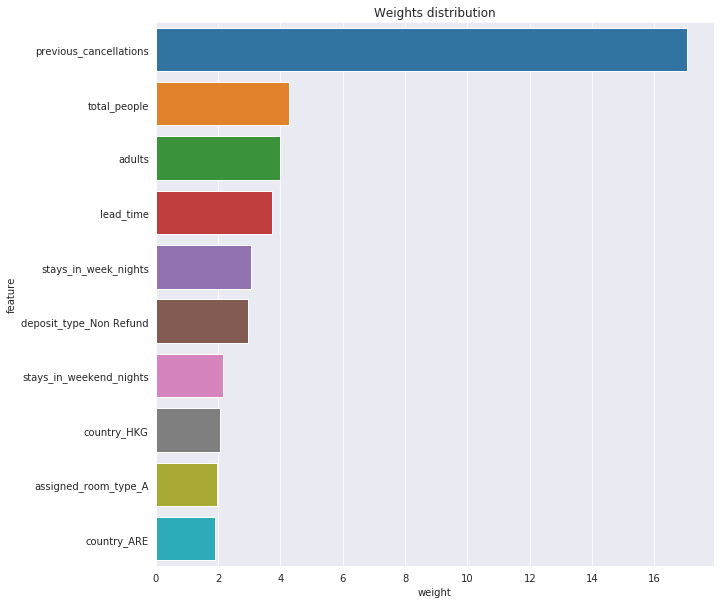

In [83]:
plt.figure(figsize=(10, 10))
plt.title('Weights distribution')
sns.barplot(data=weight_df.head(10), x='weight', y='feature');

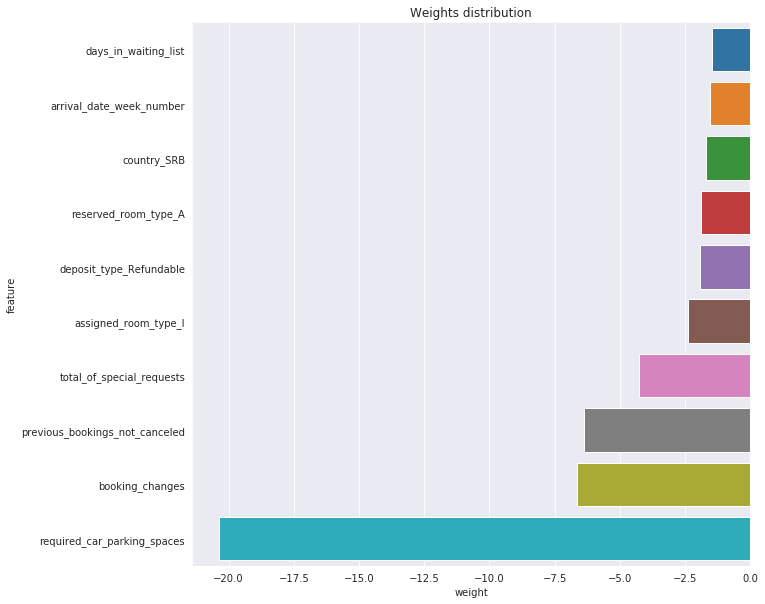

In [84]:
plt.figure(figsize=(10, 10))
plt.title('Weights distribution')
sns.barplot(data=weight_df.tail(10), x='weight', y='feature');

In [85]:
print(model.intercept_)

[-0.39602473]


## Making Predictions and Evaluating the Model


In [86]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [87]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [88]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure(figsize=(8, 6))
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds


Accuracy: 82.99%


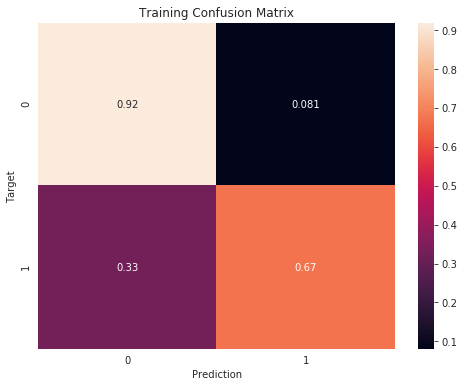

In [89]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

Accuracy: 79.41%


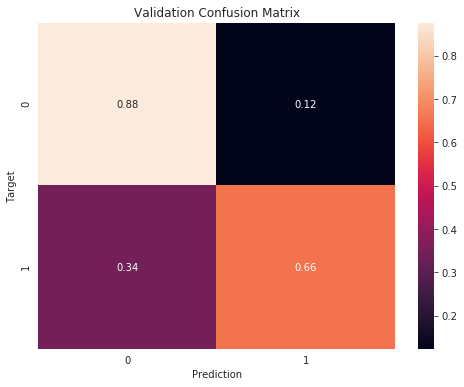

In [90]:
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Accuracy: 76.12%


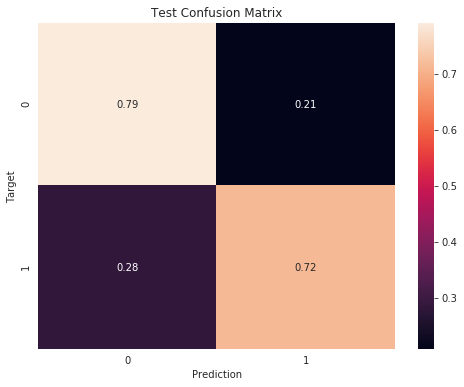

In [91]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

**Baseline Model**

In [92]:
def all_zeroes(inputs):
    return np.full(len(inputs), 0)

base_accuracy = accuracy_score(test_targets, all_zeroes(X_test))
print("Accuracy of base model (always predict 0): {:.2f}%".format(base_accuracy * 100))

Accuracy of base model (always predict 0): 59.85%


In [93]:
jovian.commit(filename='hotel-booking-demand.ipynb')

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aleksmn/hotel-booking-demand" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/aleksmn/hotel-booking-demand


'https://jovian.ai/aleksmn/hotel-booking-demand'

## Decision Tree

### Training

In [94]:
from sklearn.tree import DecisionTreeClassifier

In [95]:
# Create the model
model = DecisionTreeClassifier(random_state=11)
# Fit the model to the training data
model.fit(X_train, train_targets)

DecisionTreeClassifier(random_state=11)

### Visualization

In [96]:
from sklearn.tree import plot_tree

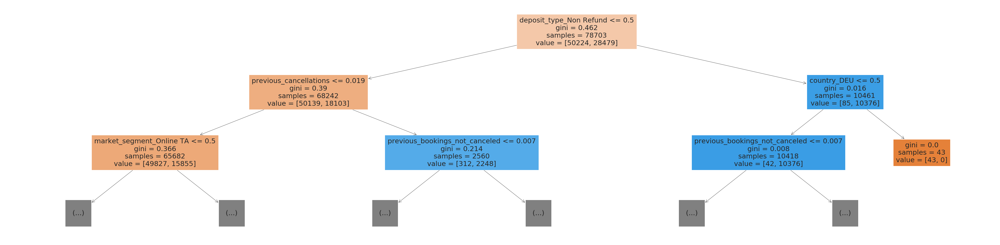

In [97]:
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=X_train.columns, max_depth=2, filled=True);

In [98]:
model.tree_.max_depth

54

### Evaluation

In [99]:
from sklearn.metrics import accuracy_score, confusion_matrix

def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure(figsize=(8, 6))
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 99.46%


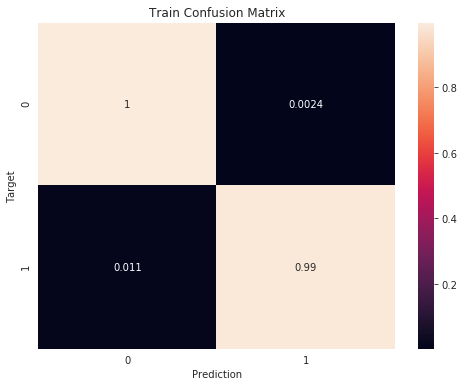

In [100]:
train_preds = predict_and_plot(X_train, train_targets, 'Train')

Accuracy: 73.90%


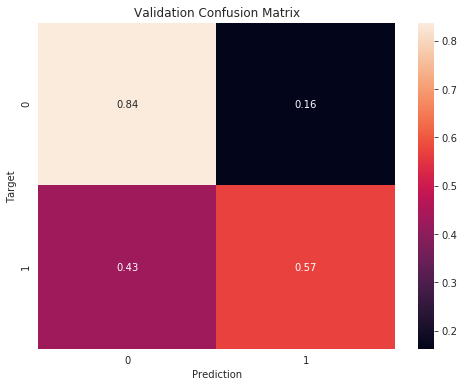

In [101]:
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Accuracy: 71.00%


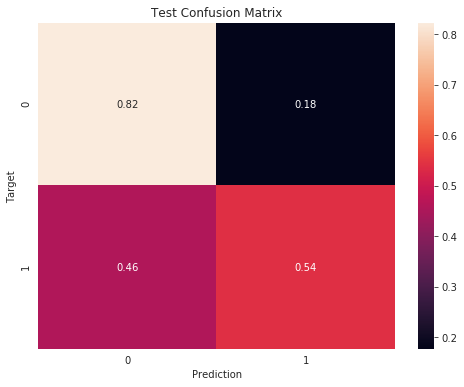

In [102]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

Training accuracy score is 99.46% vs. Test accuracy score 71.00% with very high number of false negative results (46%). That means weak generalization of model. We need to investigate feature importance and tune hyperparameters to reduce overfitting.

### Feature Importance

In [103]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [104]:
importance_df.head(10)

,feature,importance
252,deposit_type_Non Refund,0.267616
0,lead_time,0.135501
14,total_of_special_requests,0.058884
9,previous_cancellations,0.056046
171,country_PRT,0.048672
3,arrival_date_day_of_month,0.048094
2,arrival_date_week_number,0.045374
5,stays_in_week_nights,0.027890
220,market_segment_Online TA,0.027677
13,required_car_parking_spaces,0.022603


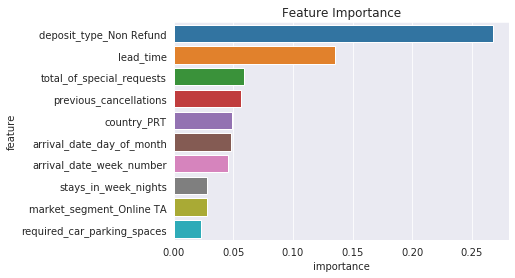

In [105]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

### Hyperparameter Tuning and Overfitting


`max_depth`

In [106]:
def max_depth_error(md):
    model = DecisionTreeClassifier(max_depth=md, random_state=11)
    model.fit(X_train, train_targets)
    train_acc = 1 - model.score(X_train, train_targets)
    val_acc = 1 - model.score(X_val, val_targets)
    return {'Max Depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [107]:
%%time
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

CPU times: user 23.3 s, sys: 718 ms, total: 24 s
Wall time: 24.1 s


In [108]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,0.231097,0.259705
1,2,0.205951,0.264919
2,3,0.203220,0.259753
3,4,0.193195,0.239892
4,5,0.171696,0.216903
5,6,0.164911,0.203346
6,7,0.147504,0.198464
7,8,0.137517,0.195431
8,9,0.129932,0.198512
9,10,0.123972,0.194388


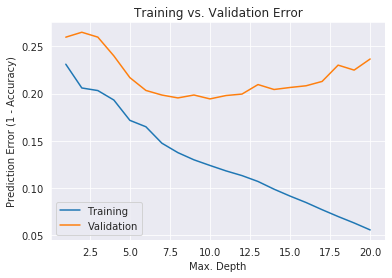

In [109]:
plt.figure()
plt.plot(np.array(errors_df['Max Depth']), np.array(errors_df['Training Error']))
plt.plot(np.array(errors_df['Max Depth']), np.array(errors_df['Validation Error']))
plt.title('Training vs. Validation Error')
plt.xlabel('Max. Depth')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation'])



### Automate hyperparameter tuning and ploting

In [110]:
from sklearn.metrics import mean_squared_error

In [111]:
def test_params(**params):
    '''Test model with parameters and return root of mean squared error (RMSE) for train and validation.'''
    # Change this line for different model:
    model = DecisionTreeClassifier(random_state=11, **params).fit(X_train, train_targets)
    train_rmse = mean_squared_error(model.predict(X_train), train_targets, squared=False)
    val_rmse = mean_squared_error(model.predict(X_val), val_targets, squared=False)
    return train_rmse, val_rmse

In [112]:
def test_param_and_plot(param_name, param_values):
    train_errors, val_errors = [], [] 
    for value in param_values:
        params = {param_name: value}
        train_rmse, val_rmse = test_params(**params)
        train_errors.append(train_rmse)
        val_errors.append(val_rmse)
    plt.figure(figsize=(10,6))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, '-o')
    plt.plot(param_values, val_errors, '-o')
    plt.xlabel(param_name)
    plt.ylabel('RMSE')
    plt.legend(['Training', 'Validation'])

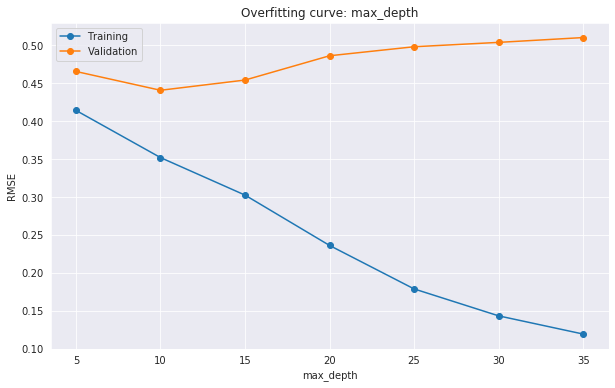

In [113]:
test_param_and_plot('max_depth', [5, 10, 15, 20, 25, 30, 35])

`max_leaf_nodes`

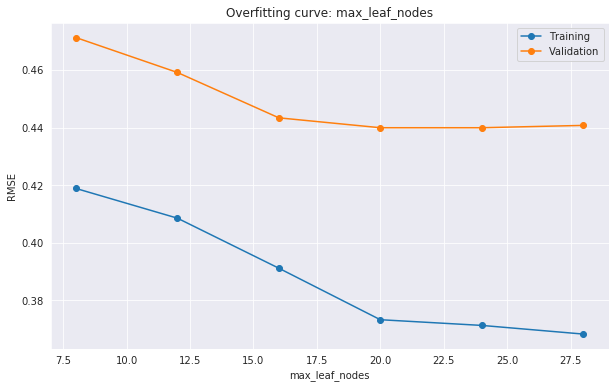

In [114]:
test_param_and_plot('max_leaf_nodes', [8, 12, 16, 20, 24, 28])

`max_features`

### Evaluate with best hyperparameters

In [115]:
# Create the model
# best parameters: max_depth=10, max_leaf_nodes=20
model = DecisionTreeClassifier(max_depth=10, max_leaf_nodes=20, random_state=11)
# Fit the model to the training data
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_depth=10, max_leaf_nodes=20, random_state=11)

Accuracy: 86.07%


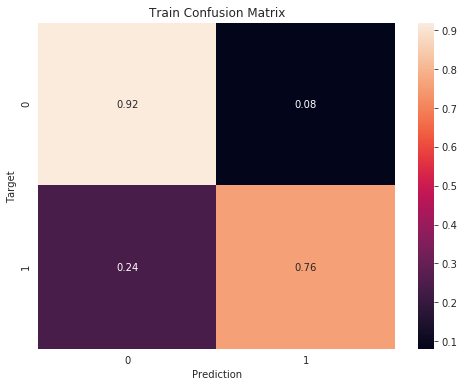

In [116]:
train_preds = predict_and_plot(X_train, train_targets, 'Train')

Accuracy: 80.65%


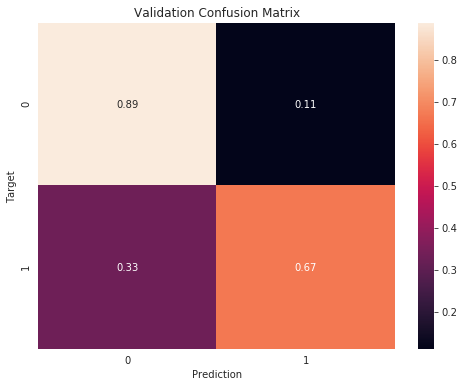

In [117]:
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Accuracy: 76.03%


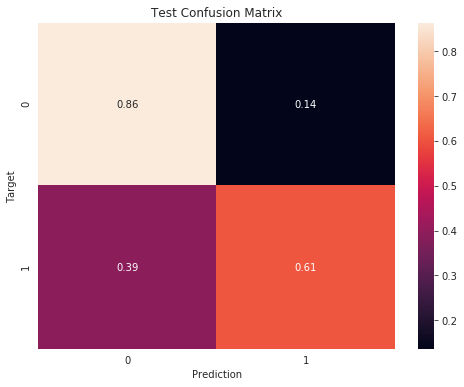

In [118]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

After hyperparameters tuning testing accuracy encreased from 71% to 76%.

## Training a Random Forest

A random forest works by averaging/combining the results of several decision trees:

<img src="https://1.bp.blogspot.com/-Ax59WK4DE8w/YK6o9bt_9jI/AAAAAAAAEQA/9KbBf9cdL6kOFkJnU39aUn4m8ydThPenwCLcBGAsYHQ/s0/Random%2BForest%2B03.gif" width="640">


We'll use the `RandomForestClassifier` class from `sklearn.ensemble`.

from sklearn.ensemble import RandomForestClassifier

In [135]:
from sklearn.ensemble import RandomForestClassifier

In [136]:
model = RandomForestClassifier(n_jobs=-1, random_state=11)

`n_jobs` allows the random forest to use mutiple parallel workers to train decision trees, and `random_state=11` ensures that the we get the same results for each execution.

In [137]:
%%time
model.fit(X_train, train_targets)

CPU times: user 26 s, sys: 414 ms, total: 26.5 s
Wall time: 12.6 s


RandomForestClassifier(n_jobs=-1, random_state=11)

In [138]:
model.score(X_train, train_targets)

0.9946126577131749

In [139]:
model.score(X_val, val_targets)

0.7879319334502536

In [140]:
model.score(X_test, test_targets)

0.7564063297600817

In [143]:
len(model.estimators_)

100

In [145]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [146]:
importance_df.head(10)

,feature,importance
0,lead_time,0.114475
252,deposit_type_Non Refund,0.083434
171,country_PRT,0.072772
14,total_of_special_requests,0.058483
3,arrival_date_day_of_month,0.054578
251,deposit_type_No Deposit,0.051613
2,arrival_date_week_number,0.048067
9,previous_cancellations,0.043178
5,stays_in_week_nights,0.038525
4,stays_in_weekend_nights,0.026059


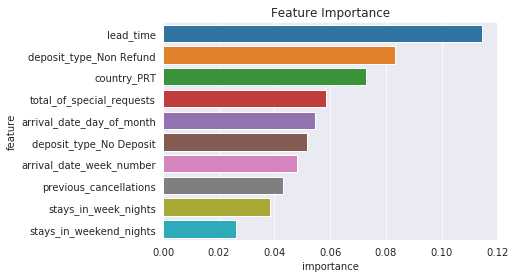

In [147]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

### Hyperparameter Tuning with Random Forests


In [148]:
def test_params(**params):
    '''Test model with parameters and return root of mean squared error (RMSE) for train and validation.'''
    # Change this line for different model:
    model = RandomForestClassifier(n_jobs=-1, random_state=11, **params).fit(X_train, train_targets)
    train_rmse = mean_squared_error(model.predict(X_train), train_targets, squared=False)
    val_rmse = mean_squared_error(model.predict(X_val), val_targets, squared=False)
    return train_rmse, val_rmse

In [149]:
def test_param_and_plot(param_name, param_values):
    train_errors, val_errors = [], [] 
    for value in param_values:
        params = {param_name: value}
        train_rmse, val_rmse = test_params(**params)
        train_errors.append(train_rmse)
        val_errors.append(val_rmse)
    plt.figure(figsize=(10,6))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, '-o')
    plt.plot(param_values, val_errors, '-o')
    plt.xlabel(param_name)
    plt.ylabel('RMSE')
    plt.legend(['Training', 'Validation'])

`n_estimators`

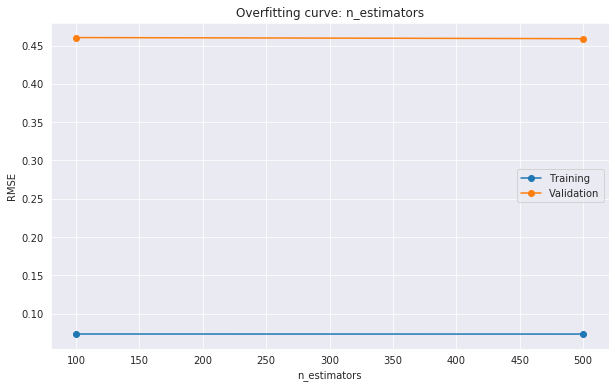

In [204]:
test_param_and_plot('n_estimators', [100, 500])

Best `n_estimators` is 100

In [157]:
# Best hyperparameters so far:

# model = RandomForestClassifier(n_jobs=-1, 
#                                random_state=11, 
#                                n_estimators=100).fit(X_train, train_targets)

`max_depth`

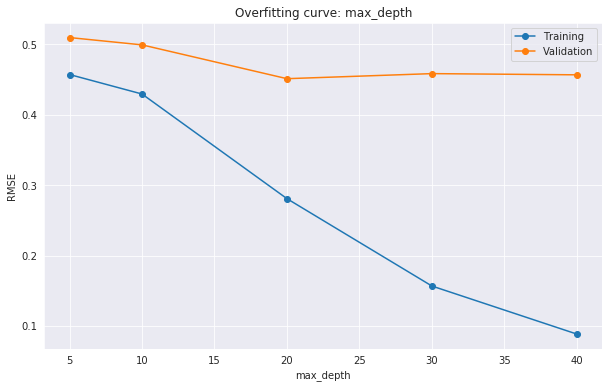

In [155]:
test_param_and_plot('max_depth', [5, 10, 20, 30, 40])

Best `max_depth` parameter is 20.

`max_leaf_nodes`

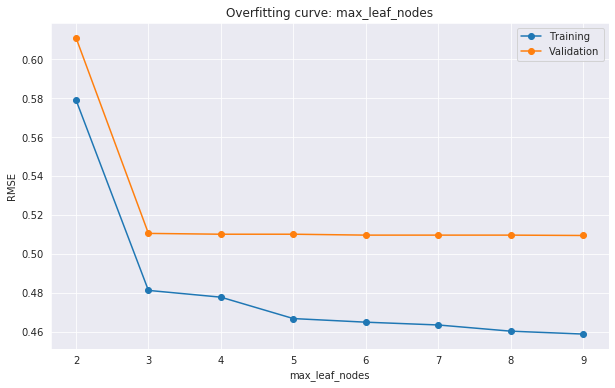

In [213]:
test_param_and_plot('max_leaf_nodes', range(2, 10))

In [193]:
test_params(class_weight={0: 1, 1: 2})

(0.0753629895498679, 0.4580832475092007)

In [197]:
test_params(bootstrap=False)

(0.07331191097540467, 0.46261373825821017)

In [195]:
test_params(bootstrap=True) 
# default

(0.0733985169252428, 0.46050848694649094)

### Putting it together

Train random forest with custom hyperparameters. 

In [218]:
model = RandomForestClassifier(n_jobs=-1, 
                               random_state=11, 
                               n_estimators=200,
                               max_depth=10,
                               max_leaf_nodes=20,
                               class_weight={0: 1, 1: 2}).fit(X_train, train_targets)

Accuracy: 76.49%


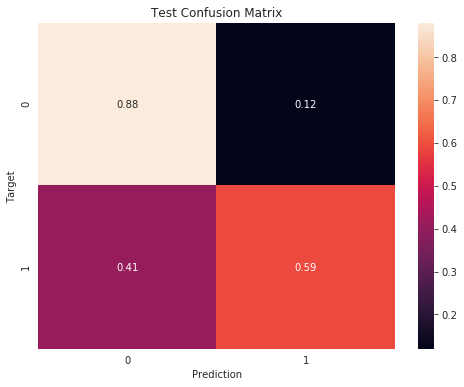

In [219]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

Final accuracy is 76.49%

## Making Predictions on New Inputs


In [249]:
def predict_input(model, single_input):
    input_df = pd.DataFrame([single_input])
    input_df.is_repeated_guest = input_df.is_repeated_guest.astype('object')
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [264]:
bookings_df.head(1)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_children,total_people
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01,0.0,2.0


In [261]:
new_input = {'hotel': 'Resort Hotel',
            'lead_time': 1,
            'arrival_date_year': 2017,
            'arrival_date_month': 'July',
            'arrival_date_week_number': 27,
            'arrival_date_day_of_month': 25,
            'stays_in_weekend_nights': 3,
            'stays_in_week_nights': 2,
            'adults': 2,
            'children': 1,
            'babies': 0,
            'meal': 'BB',
            'country': 'PRT',
            'market_segment': 'Direct',
            'distribution_channel': 'Direct',
            'is_repeated_guest': 0,
            'previous_cancellations': 4,
            'previous_bookings_not_canceled': 0,
            'reserved_room_type': 'C',
            'assigned_room_type': 'C',
            'booking_changes': 7,
            'deposit_type': 'No Deposit',
            'days_in_waiting_list': 0,
            'customer_type': 'Transient',
            'adr': 0.0,
            'required_car_parking_spaces': 0,
            'total_of_special_requests': 0,
            'total_children': 0,
            'total_people': 3}

In [262]:
pred, prob = predict_input(model, new_input)
print("Prediction: {}, probability: {}".format(pred, prob))

Prediction: 0, probability: 0.5907692034492346


## Saving and Loading Trained Models


In [263]:
import joblib

In [267]:
booking_cancel = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [268]:
joblib.dump(booking_cancel, 'booking_cancel.joblib')

['booking_cancel.joblib']

In [269]:
booking_cancel2 = joblib.load('booking_cancel.joblib')

In [271]:
test_preds2 = booking_cancel2['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.7648800408371618

## Summary and References


This notebook is covering following topics.
* Problem statement
* Downloading the data
* Exploratory data analysis and visualisation
* Preprocessing and Feature Engineering
* Imputing and scaling numerical data
* Encoding categorical data
* Training and evaluating Logistic Regression Model
* Training and evaluating Decision Tree Model
* Training and evaluating  Random Forest Model
* Making Predictions on New Inputs
* Saving and Loading Trained Model


**References**
- [Source of data](https://www.kaggle.com/jessemostipak/hotel-booking-demand)
- [Interesting Kaggle notebook](https://www.kaggle.com/cssaiyer94/booking-cancellation-prediction-draft)
- [Plotly Express](https://plotly.com/python/plotly-express/)
- [Decision Trees Model](https://scikit-learn.org/stable/modules/tree.html)
- [Random Forest Classifier Model](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)
- [Bootstraping in Random Forest](https://towardsdatascience.com/what-is-out-of-bag-oob-score-in-random-forest-a7fa23d710)


In [2]:
import jovian
jovian.commit(filename='hotel-booking-demand.ipynb')

<IPython.core.display.Javascript object>

[jovian] Updating notebook "aleksmn/hotel-booking-demand" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/aleksmn/hotel-booking-demand


'https://jovian.ai/aleksmn/hotel-booking-demand'